# AI For Healthcare - Ex1
## Overview
In this assignment you will explore the basic principles of image reconstruction in computed tomography (CT), filtered back projection and iterative reconstruction. You will use functions to convert an image into radon space and create a sinogram, a synthetic projection per radon or fanbeam (corresponding to parallel or fanbeam geometry respectively). Then utilizing those synthetic projections, you will
reconstruct the original image.

## What to hand in for this assignment
Submit your notebook solutions (code)+ written explanations/ descriptions in word/pdf.

## References
*   https://www.youtube.com/watch?v=rKh_XIpsuc4 : General
*   https://www.youtube.com/watch?v=q7Rt_OY_7tU: Sinogram 
*   https://www.youtube.com/watch?v=MA2y_2YySq0&t=3s: Radon Transform 
*   https://www.youtube.com/watch?v=pZ7JlXagT0w : FBP 
*   https://www.youtube.com/watch?v=r5ZIzog2JlE 
*   https://www.youtube.com/watch?v=gu0lcxdFO1Q: Algebraic reconstruction 
*   https://www.youtube.com/watch?v=moWou9zNl1w: SIRT 
*   https://www.youtube.com/watch?v=YIvTpW3IevI: Fourier Slice Theorem


# Submitted

*   Shir Nitzan
*   Timor Baruch
*   Hadar Pur



# Instructions
To run the notebook, there is a need to upload zip file that contains the circle and line images.

The zip file attached to the submission box that called "Images.zip"

# Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import warnings
import zipfile
import io
import os

from pathlib import Path
from google.colab import files
from PIL import Image
from skimage import data, transform, exposure
from skimage.data import shepp_logan_phantom
from mpl_toolkits.axes_grid1 import ImageGrid
from scipy.ndimage import rotate
from skimage.transform import radon, iradon, rescale, iradon_sart

warnings.filterwarnings("ignore")

# Images Handler

In [ ]:
# upload zip images if needed

# Specify path
path_circle = '/content/circle.jpg'
path_line = '/content/line.jpg'
   
# Check whether the specified path exists or not
isExist = os.path.exists(path_circle) and os.path.exists(path_line)

if not isExist:
  uploaded = files.upload()

  data = zipfile.ZipFile(io.BytesIO(uploaded['Images.zip']), 'r')
  data.extractall()

In [ ]:
# Create Shepp-Logan head phantom
phantom = shepp_logan_phantom()

# Create  circle
circle = cv2.imread(path_circle, cv2.IMREAD_GRAYSCALE)

# Create  line
line = cv2.imread(path_line, cv2.IMREAD_GRAYSCALE)

# Step 1
Create a head phantom or use the Shepp-Logan head phantom. The bright ellipse corresponds to the skull and the structures inside correspond to the various brain tissues and lesions. Calculate the synthetic projection using radon transform (parallel beam geometry) for the head phantom and the geometric images and explain your results.

In [ ]:
def display_plt(phantom, sinogram):
  fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 3.5))
  
  ax1.set_title("The Original image")
  ax1.imshow(phantom, cmap=plt.cm.gray)

  ax2.set_title("Sinogram\n(Radon transform)")
  ax2.set_xlabel("Projection angles (deg)")
  ax2.set_ylabel("Projection position (pixels)")
  ax2.imshow(sinogram, cmap=plt.cm.gray)

  fig.tight_layout()
  plt.show()

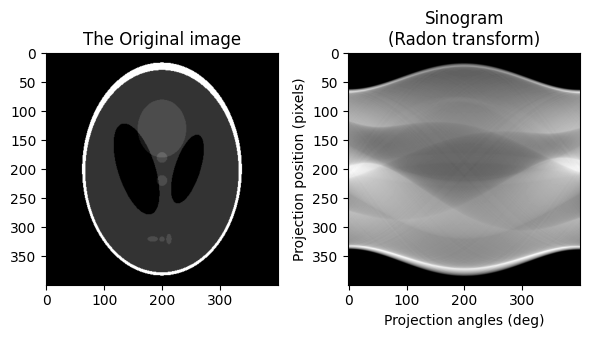

In [ ]:
# Calculate radon transform (parallel beam geometry) - phantom
theta = np.linspace(0., 180., max(phantom.shape), endpoint=False)
sinogram = radon(phantom, theta=theta, circle=True)
display_plt(phantom, sinogram)

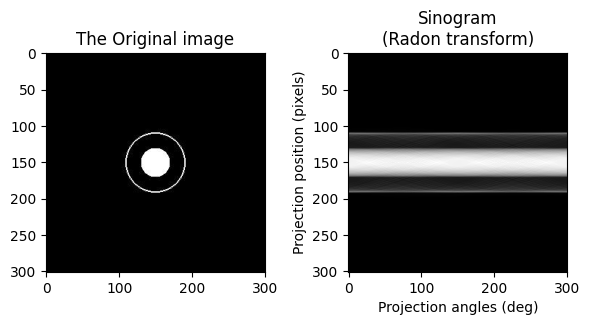

In [ ]:
# Calculate radon transform (parallel beam geometry) - circle
theta = np.linspace(0., 180., max(circle.shape), endpoint=False)
sinogram = radon(circle, theta=theta, circle=True)
display_plt(circle, sinogram)

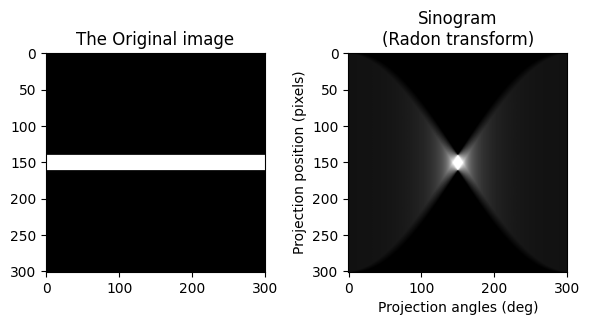

In [ ]:
# Calculate radon transform (parallel beam geometry) - line
theta = np.linspace(0., 180., max(line.shape), endpoint=False)
sinogram = radon(line, theta=theta, circle=True)
display_plt(line, sinogram)

# Step 2
Vary the number of projection angles (18, 24, 90, ...) and perform a reconstruction for each angle increment. Explain the effect of varying the angles.

In [ ]:
def get_radon_transform(image, angles, show_image=True):
  print("\n")
  image = rescale(image, scale=0.4, mode='reflect')
  theta = np.linspace(0., 180.0, min(angles, image.shape[0]), endpoint=False)
  sinogram = radon(image, theta=theta)
  dx, dy = 0.5 * angles / max(image.shape), 0.5 / sinogram.shape[0]

  if (show_image):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(6, 3.5))

    fig.suptitle('Original')

    ax1.set_title("The Original image")
    ax1.imshow(image, cmap=plt.cm.gray)

    ax2.set_title(f"Sinogram\n(Radon transform)\nNum of angles: {angles}")
    ax2.set_xlabel("Projection angles (deg)")
    ax2.set_ylabel("Projection position (pixels)")
    ax2.imshow(sinogram, cmap=plt.cm.gray, extent=(-dx, angles + dx, -dy, sinogram.shape[0] + dy), aspect='auto')

    fig.tight_layout()
    plt.show()
  
  return theta, sinogram

In [ ]:
def get_reconstruction(image, sinogram, angles):
  print("\n")
  image = rescale(image, scale=0.4, mode='reflect')
  theta = np.linspace(0., 180.0, min(angles,image.shape[0]), endpoint=False)
  reconstruction_fbp = iradon(sinogram, theta=theta)

  error = reconstruction_fbp - image
  error_calc = np.sqrt(np.mean(error**2))
  imkwargs = dict(vmin=-0.2, vmax=0.2)

  fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(4, 3.5), sharex=True, sharey=True)

  fig.suptitle('After Reconstruction')
  axes[0].set_title("Reconstruction")
  axes[0].set_ylabel(f'Num of angles: {angles}')
  axes[0].imshow(reconstruction_fbp, cmap=plt.cm.gray)

  axes[1].set_title(f"Error: {error_calc:.3g}")
  axes[1].set_ylabel(f'Num of angles: {angles}')
  axes[1].imshow(error, cmap=plt.cm.gray, **imkwargs)

  plt.tight_layout()
  plt.show()

In [ ]:
def create_radon_and_reconstruct(image):
  angles_array = [18, 24, 90, 120, 180, 240, 360]

  for angles in angles_array:
    theta, sinogram = get_radon_transform(image, angles)
    get_reconstruction(image, sinogram, angles)

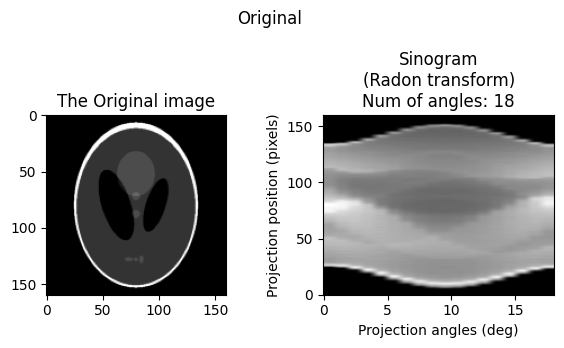

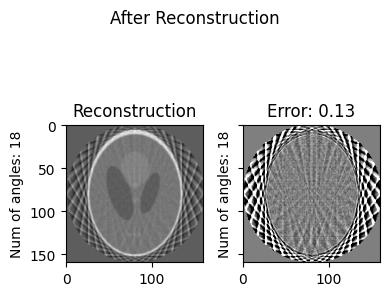

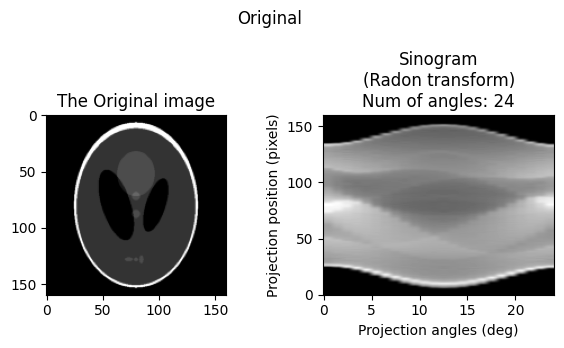

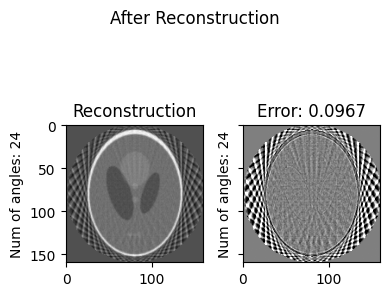

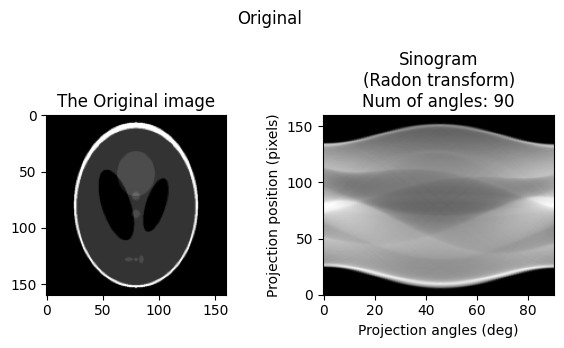

...

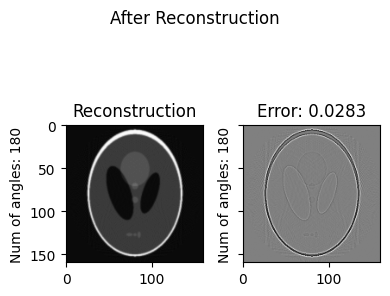

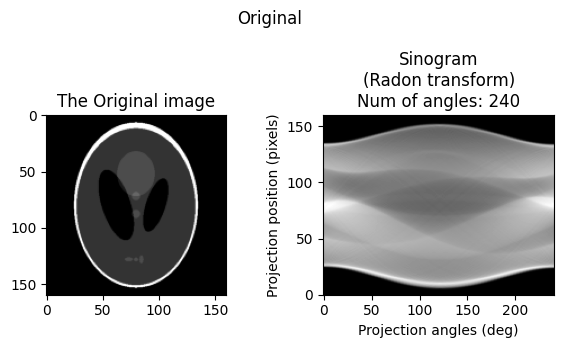

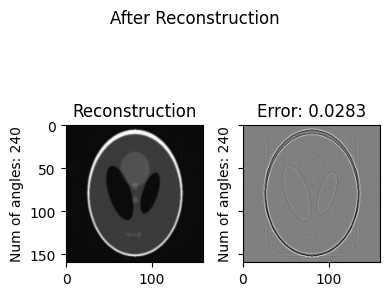

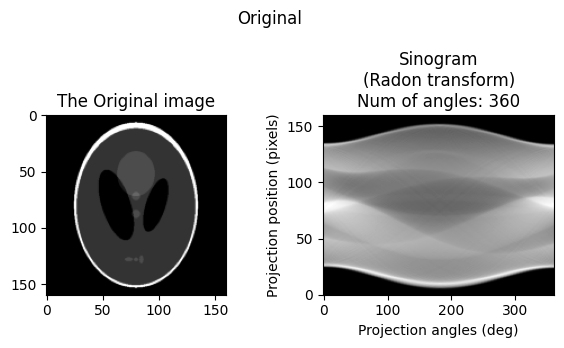

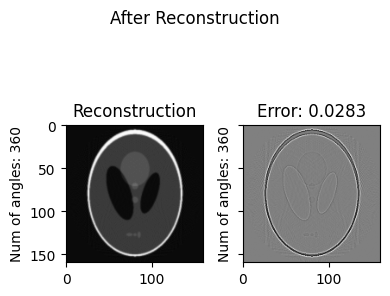

In [ ]:
create_radon_and_reconstruct(phantom)

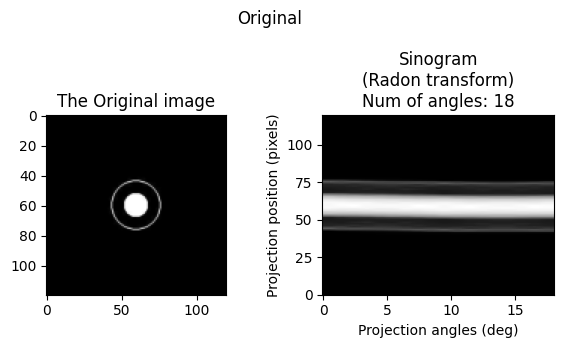

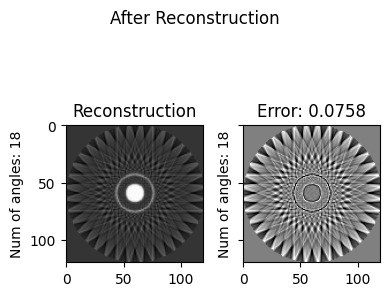

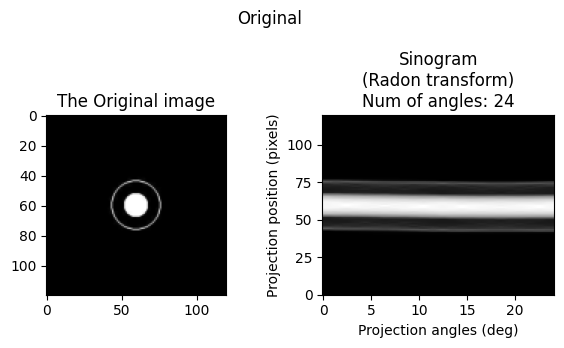

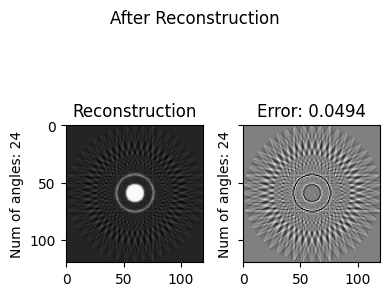

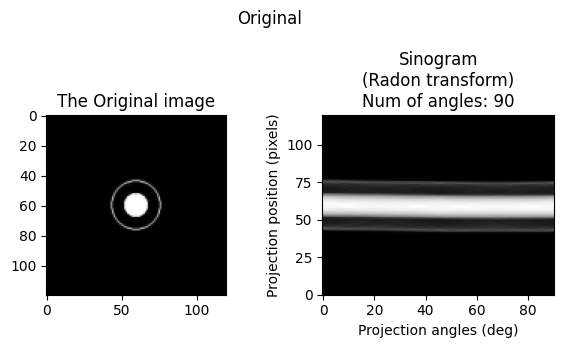

...

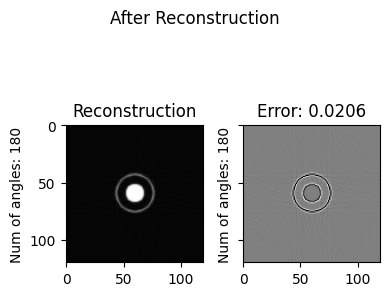

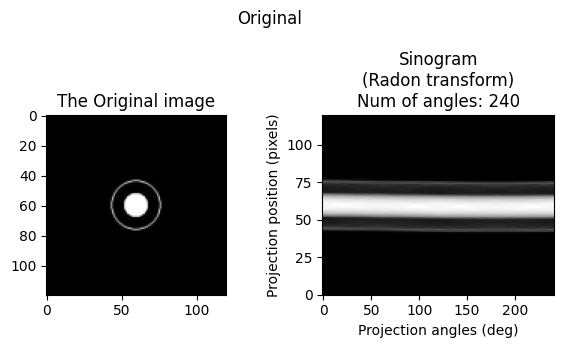

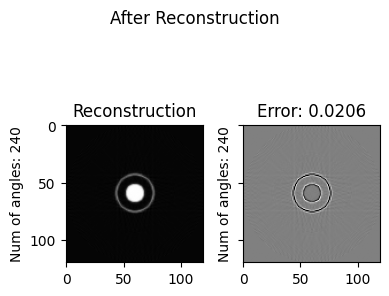

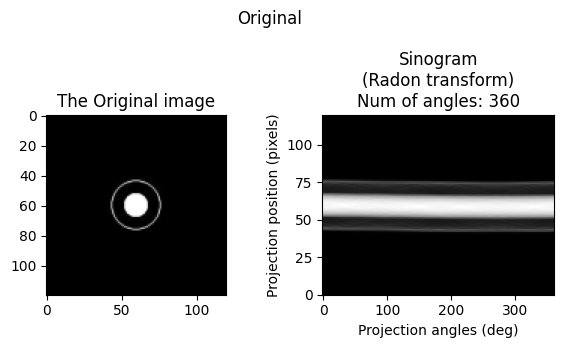

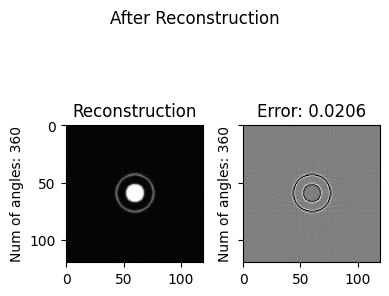

In [ ]:
create_radon_and_reconstruct(circle)

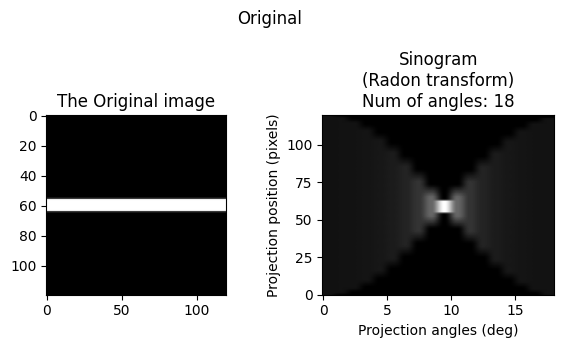

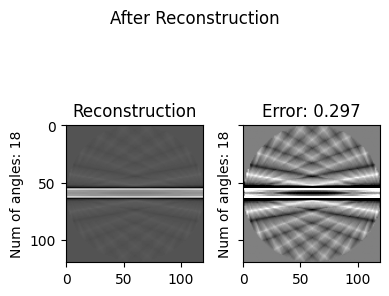

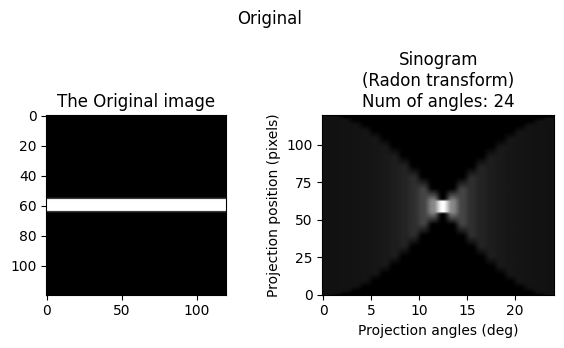

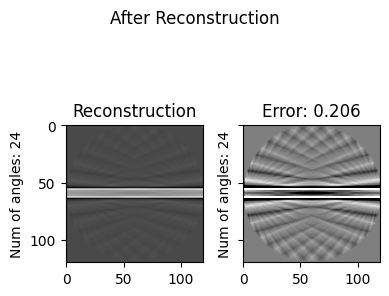

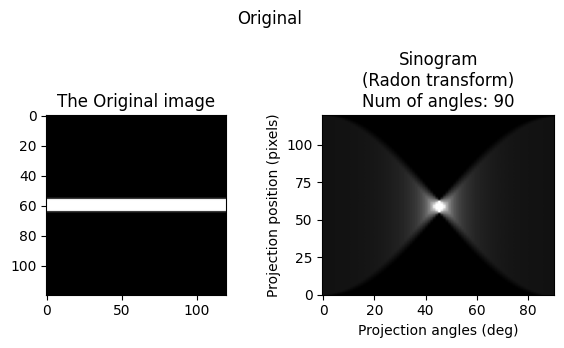

...

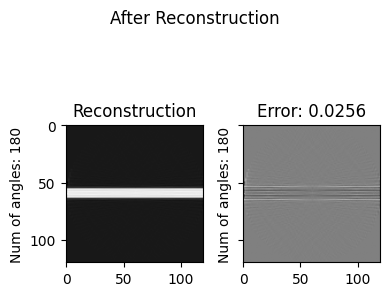

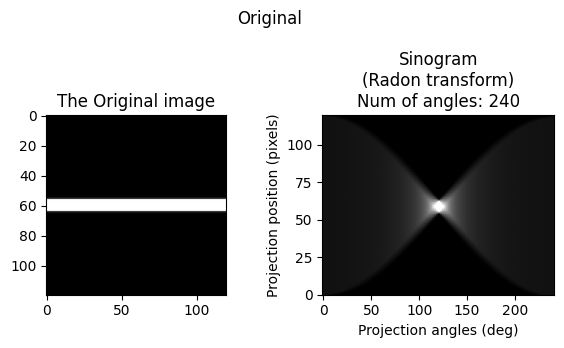

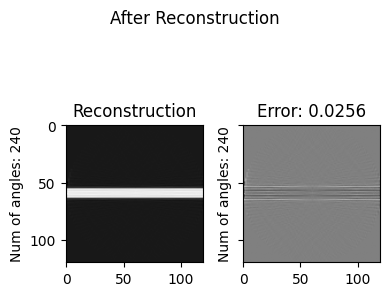

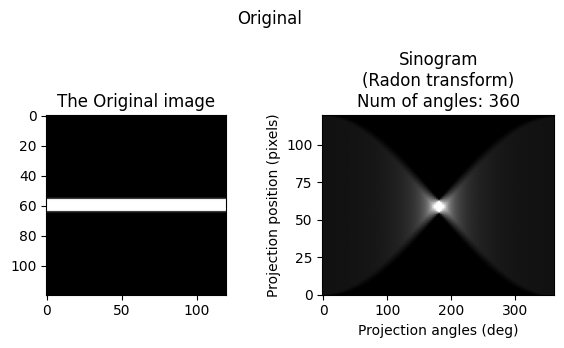

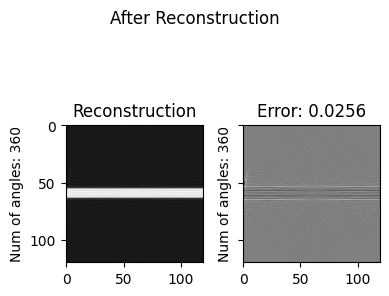

In [ ]:
create_radon_and_reconstruct(line)

# Step 3
Demonstrate the difference of performing back projection and filtered back projection.

In [ ]:
def get_reconstruction_filtered(image, sinogram, angles):
  image = rescale(image, scale=0.4, mode='reflect')
  filters = ['ramp', 'shepp-logan', 'cosine', 'hamming', 'hann', None]
  fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(16, 6), sharex=True, sharey=True)
  
  for i, ax in enumerate(axes.flatten()):
    if i < len(filters):
      filter_type = filters[i]
      theta = np.linspace(0., 180.0, min(angles, image.shape[0]), endpoint=False)
      reconstruction_fbp = iradon(sinogram, theta=theta, filter_name=filter_type)

      ax.set_title("Reconstruction")
      ax.set_ylabel(f'Num of angles: {angles}')
      ax.imshow(reconstruction_fbp, cmap=plt.cm.gray)
        
    else:
      index = i - len(filters)
      filter_type = filters[index]
      reconstruction_fbp = iradon(sinogram, theta=theta, filter_name=filter_type)
      error = reconstruction_fbp - image
      error_calc = np.sqrt(np.mean(error ** 2))
      imkwargs = dict(vmin=-0.2, vmax=0.2)

      ax.set_title(f"Error: {error_calc:.3g} \nfilter: {filter_type}")
      ax.set_ylabel(f'Num of angles: {angles}')
      ax.imshow(error, cmap=plt.cm.gray, **imkwargs)

  plt.subplots_adjust(bottom=0)
  plt.show()

In [ ]:
def create_radon_and_reconstruct_filtered(image):
  angles_array = [18, 24, 90, 120, 180, 240, 360]

  for angles in angles_array:
    theta, sinogram = get_radon_transform(image, angles)
    get_reconstruction_filtered(image, sinogram, angles)

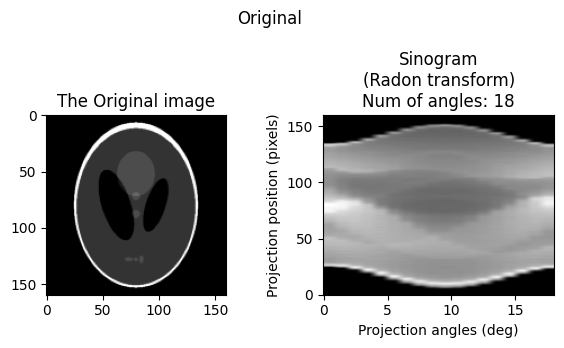

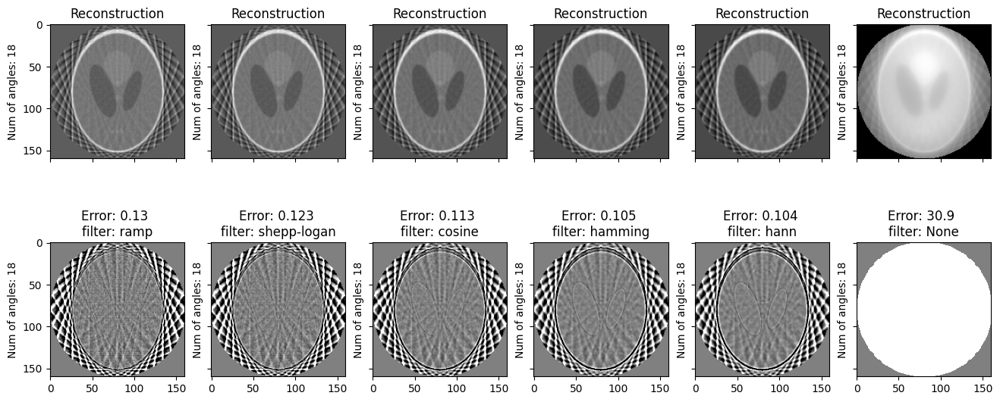

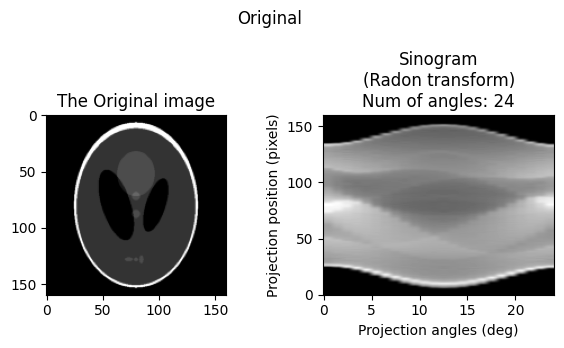

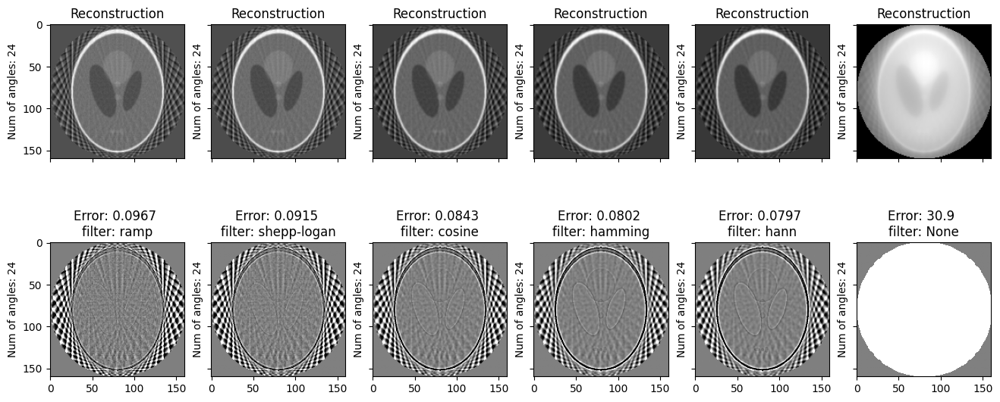

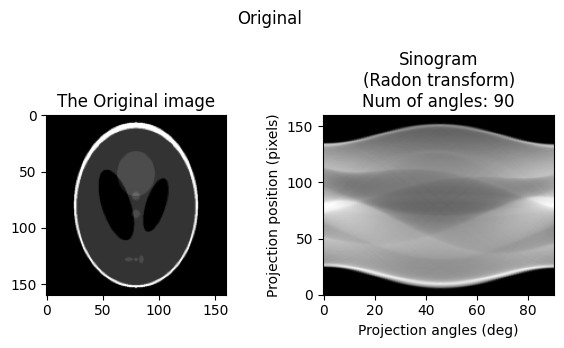

...

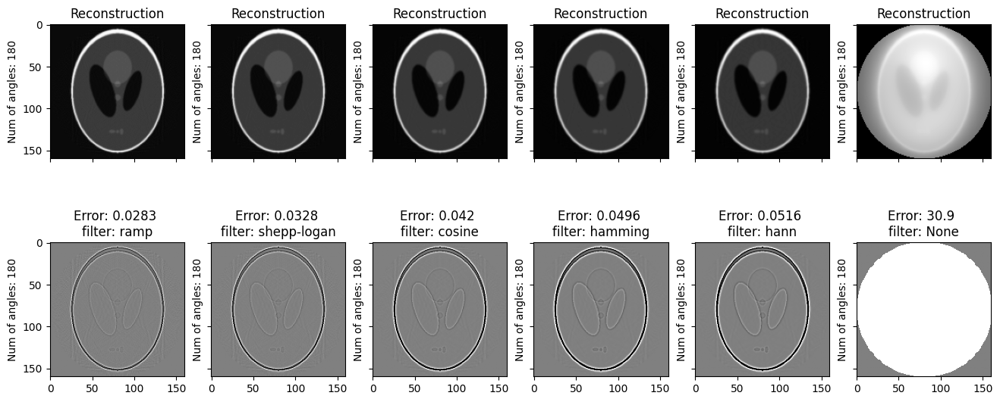

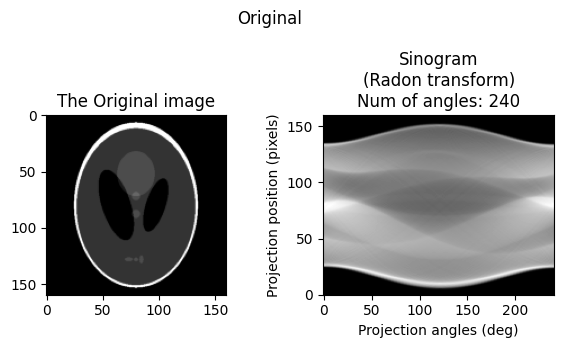

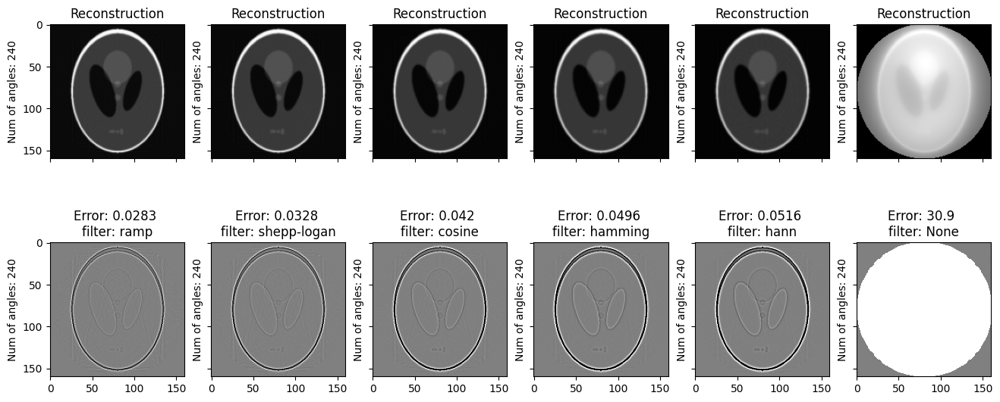

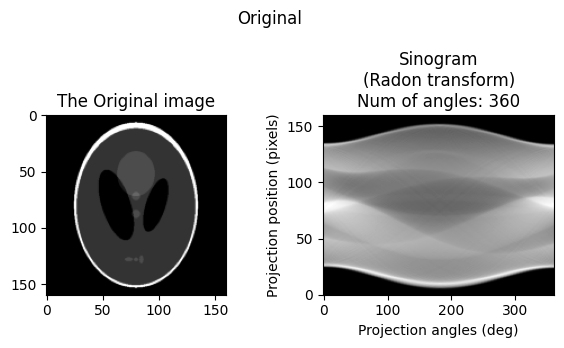

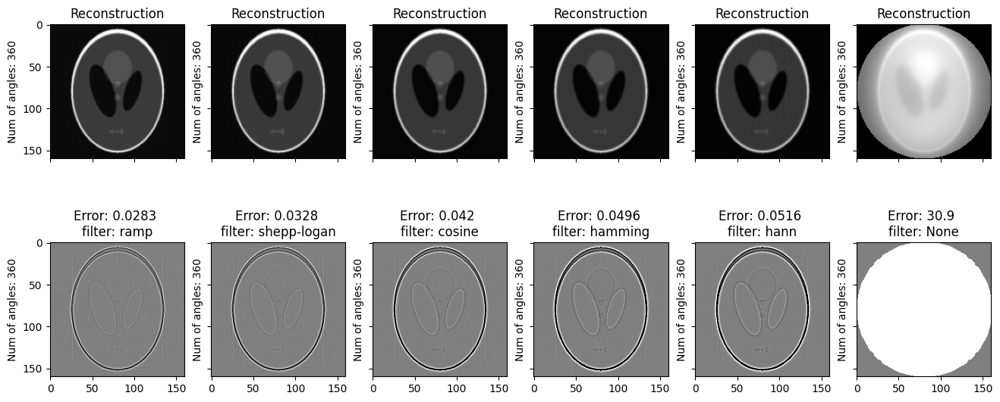

In [ ]:
create_radon_and_reconstruct_filtered(phantom)

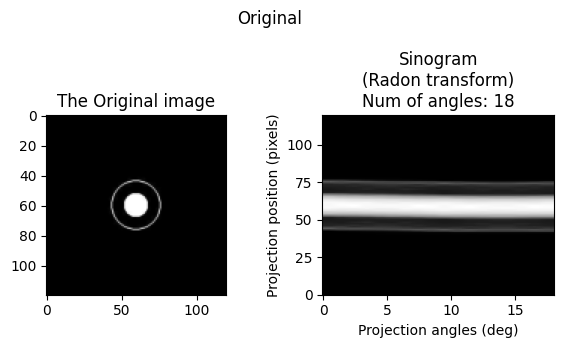

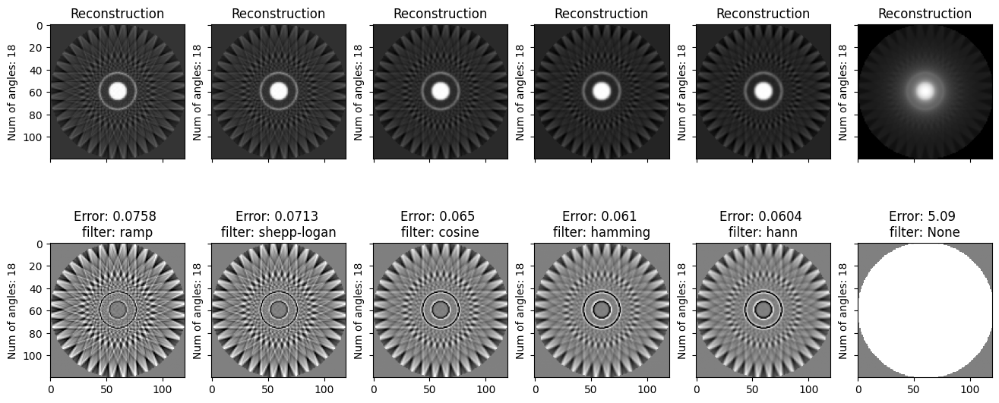

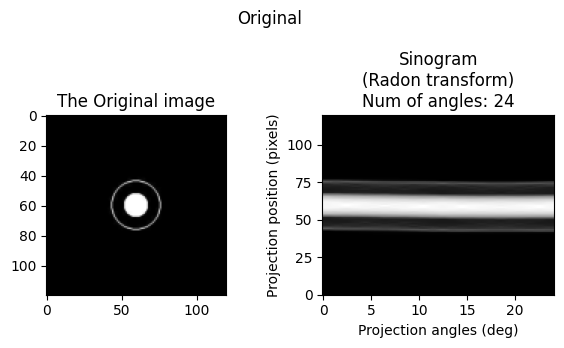

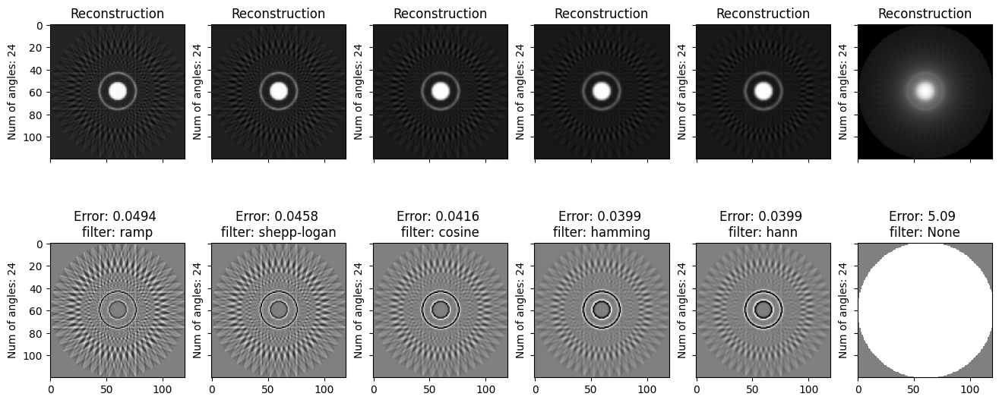

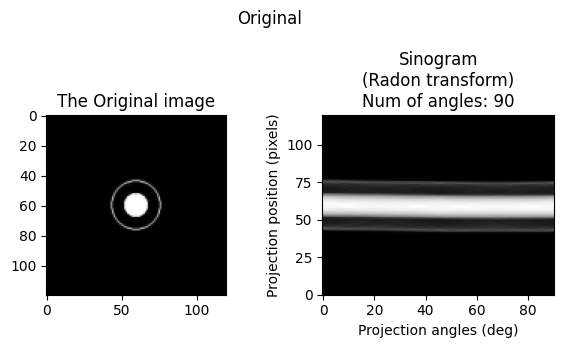

...

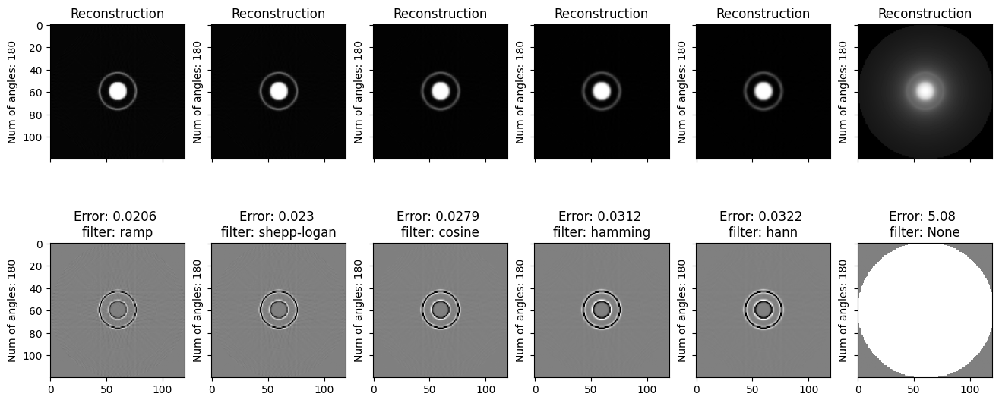

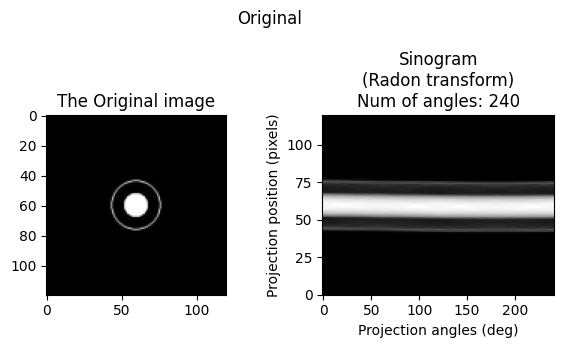

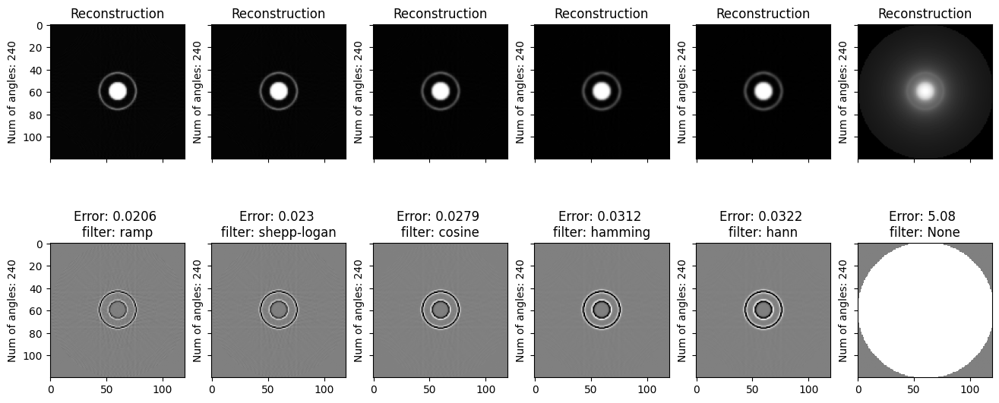

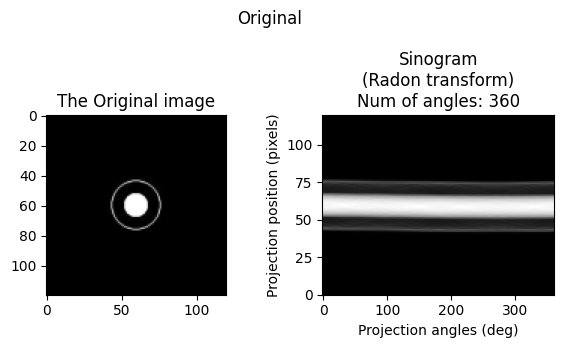

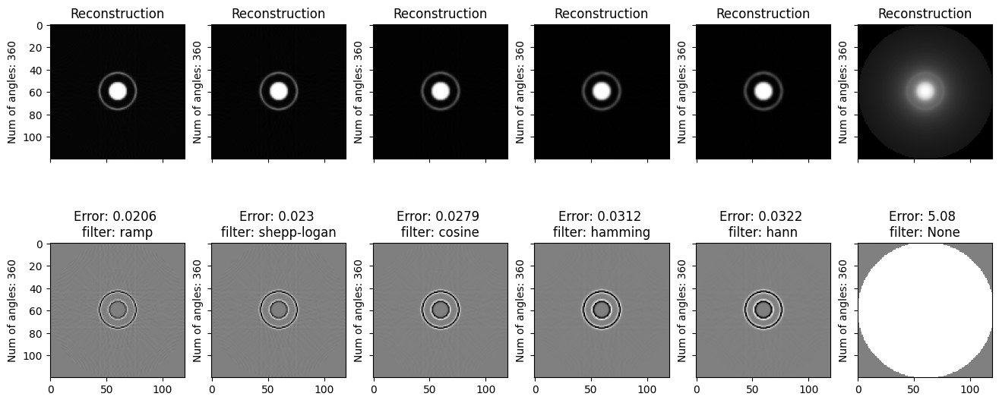

In [ ]:
create_radon_and_reconstruct_filtered(circle)

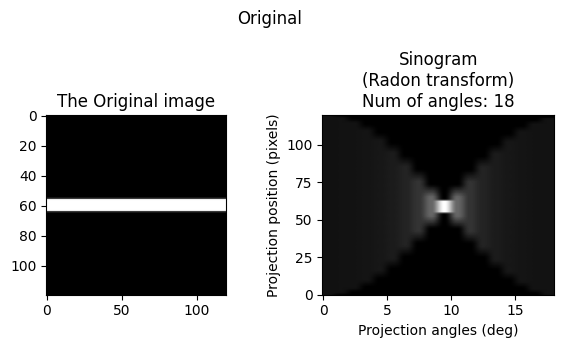

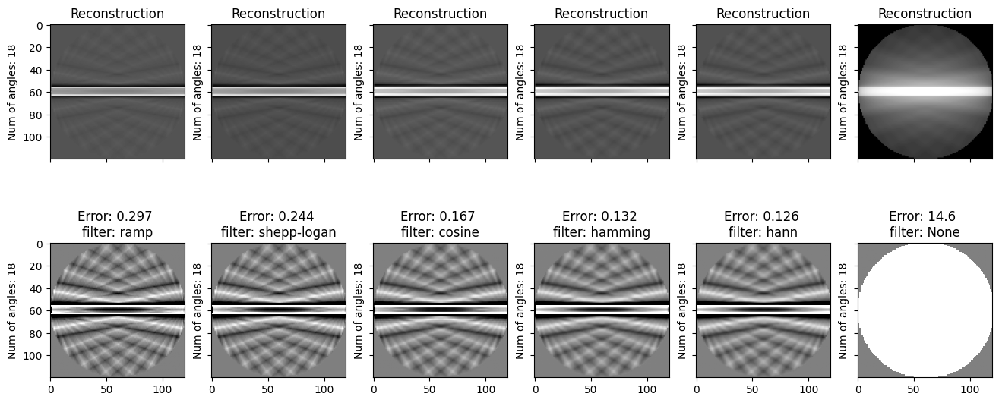

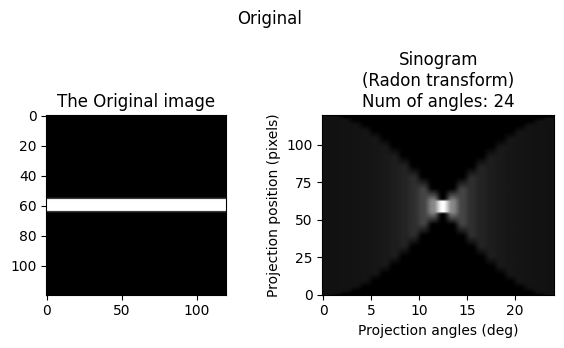

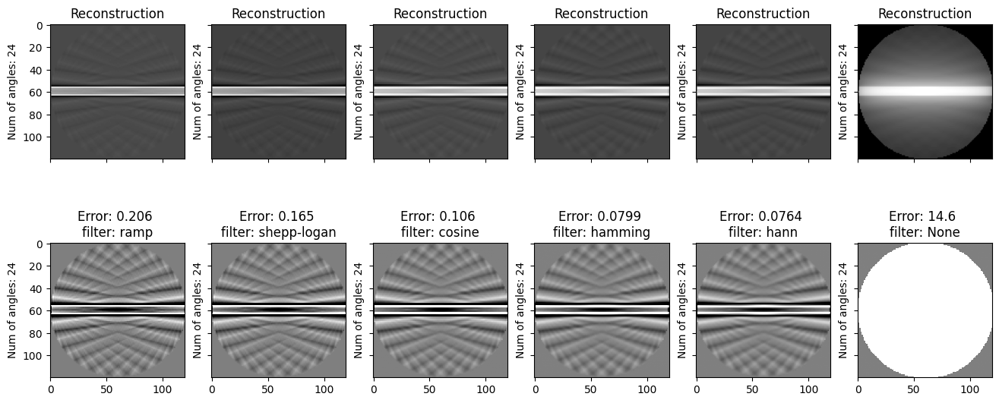

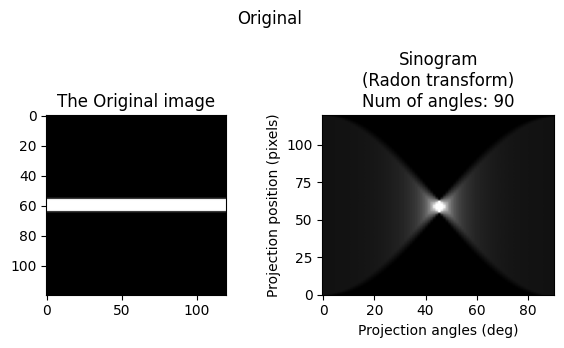

...

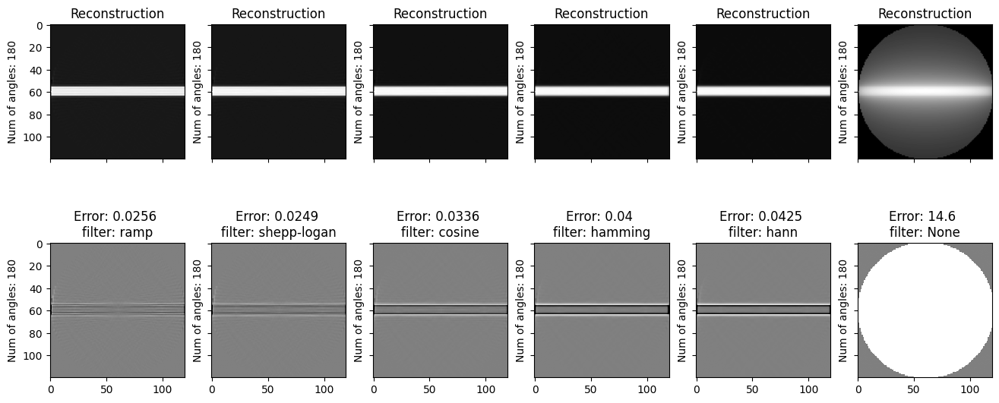

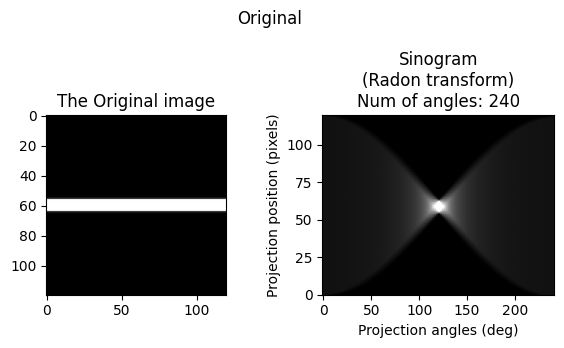

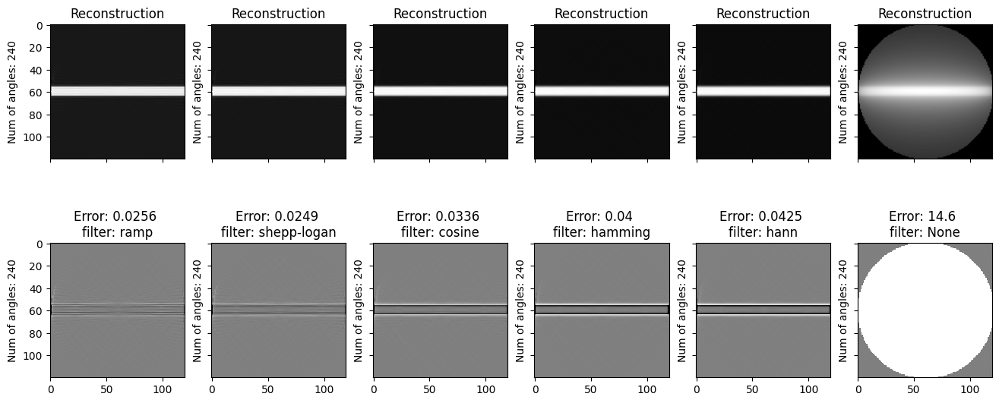

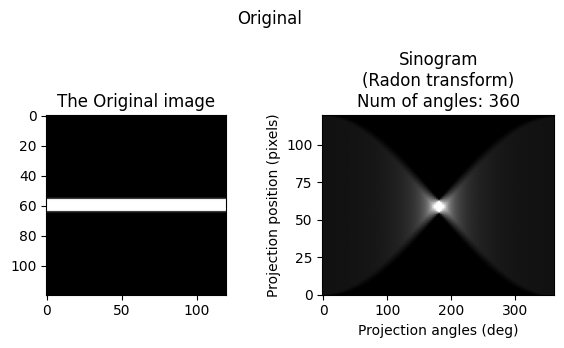

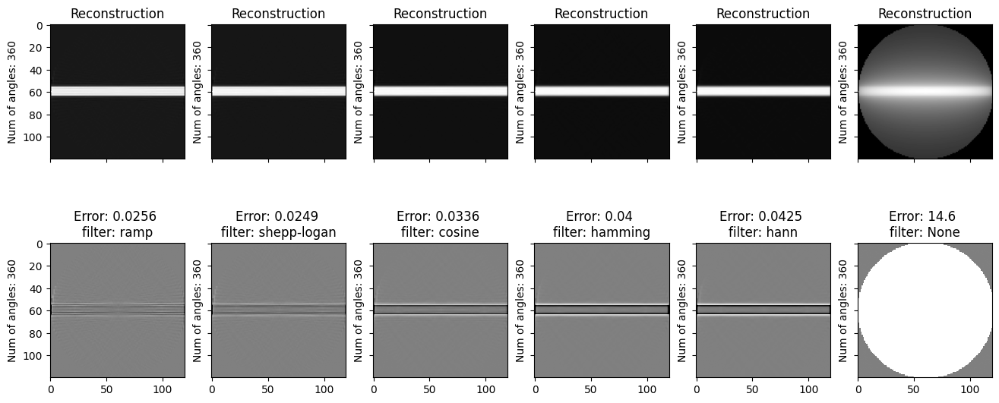

In [ ]:
create_radon_and_reconstruct_filtered(line)

# Step 4
Apply & describe an algebraic iterative reconstruction technique such as SIRT/ CGLS/ another.

In [ ]:
def apply_sart(image, angles, num_of_iterations):
  theta, sinogram = get_radon_transform(image, angles, show_image=False)
  image = rescale(image, scale=0.4, mode='reflect')
  reconstruction = iradon_sart(sinogram, theta=theta)
  imkwargs = dict(vmin=-0.2, vmax=0.2)

  for index in range(num_of_iterations):
    error = reconstruction - image
    error_calc =  np.sqrt(np.mean(error**2))

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(8, 4.5), sharex=True, sharey=True)
    ax = axes.ravel()
    
    ax[0].set_title("Original Image")
    ax[0].imshow(image, cmap=plt.cm.gray)

    ax[1].set_title(f"SART Reconstruction\n iteration = {index}")
    ax[1].imshow(reconstruction, cmap=plt.cm.gray)

    ax[2].set_title(f"Error SART\n iteration = {index}, error = {error_calc:.3g}")
    ax[2].imshow(reconstruction - image, cmap=plt.cm.gray, **imkwargs)

    plt.show()
    reconstruction = iradon_sart(sinogram, theta=theta, image=reconstruction)

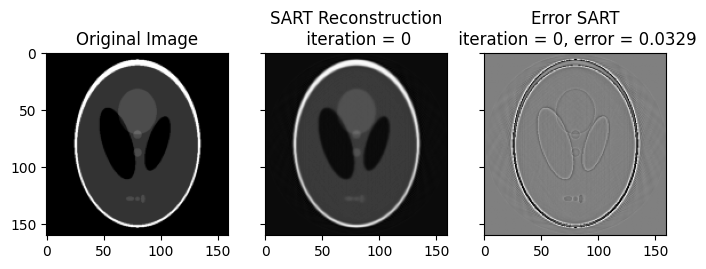

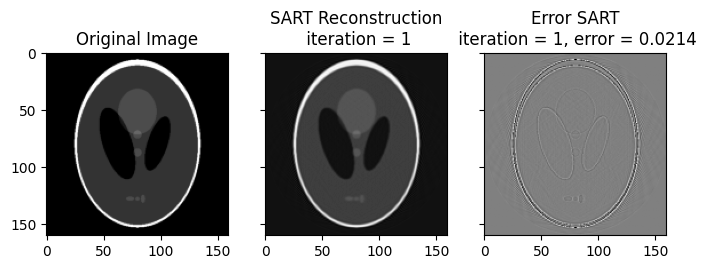

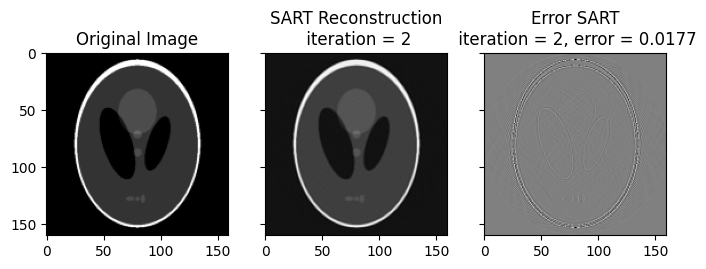

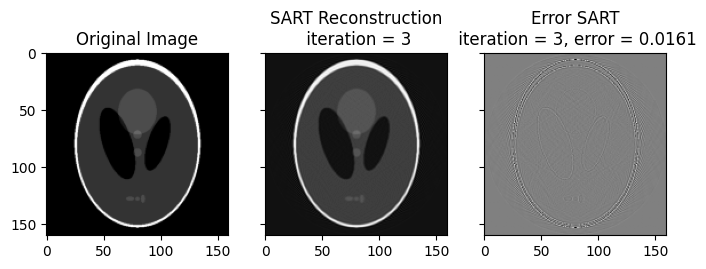

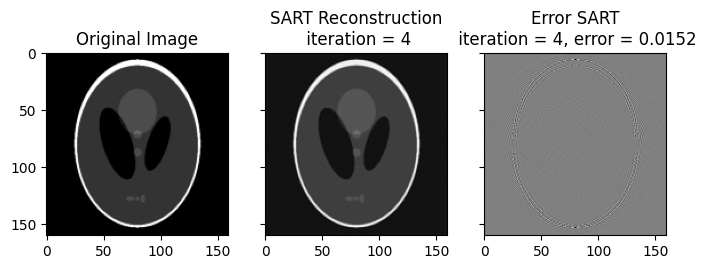

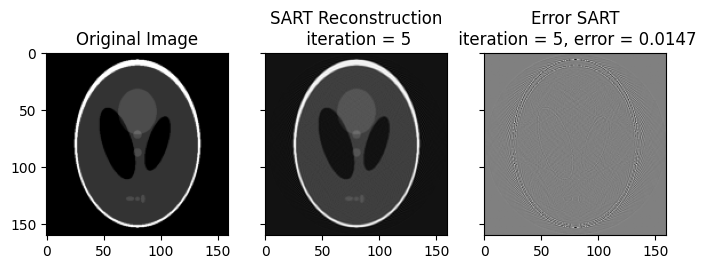

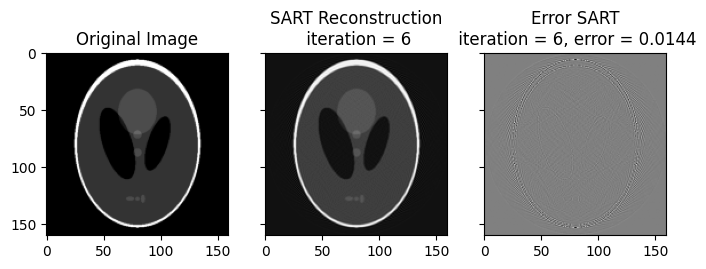

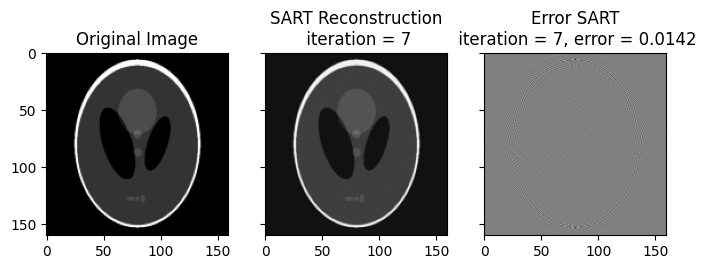

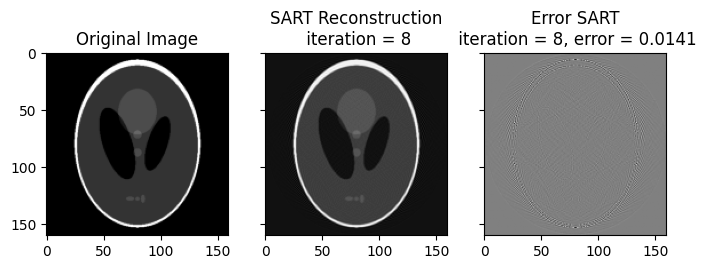

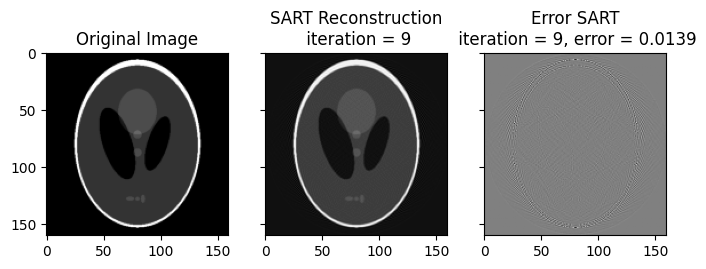

In [ ]:
apply_sart(phantom, 180, 10)

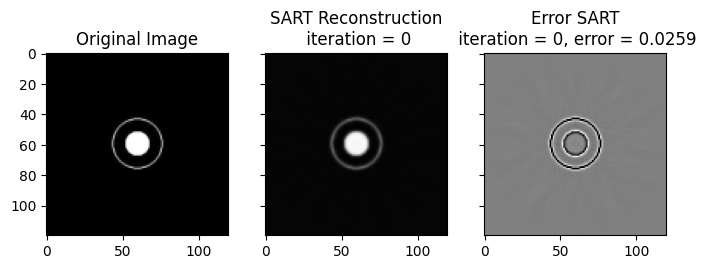

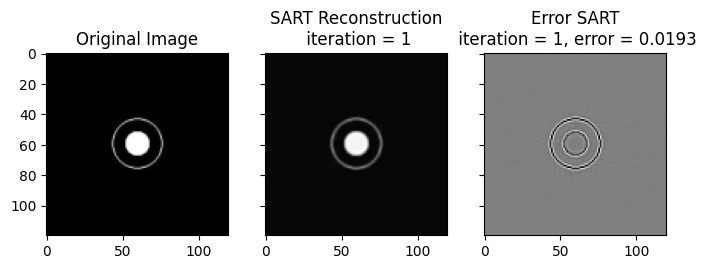

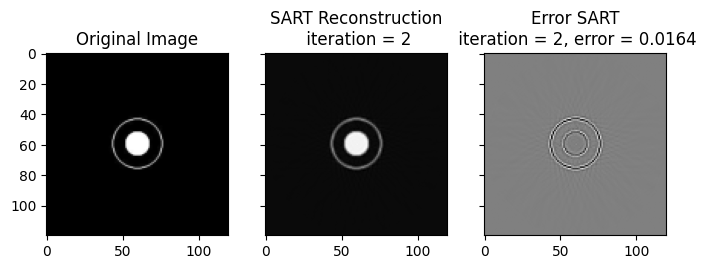

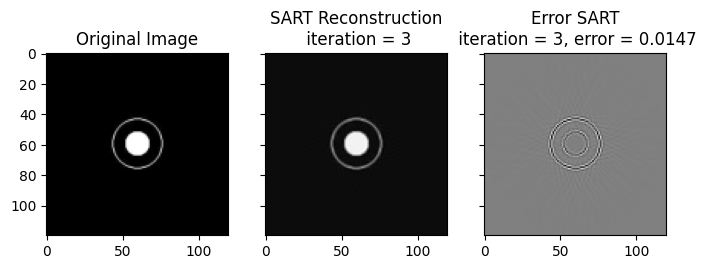

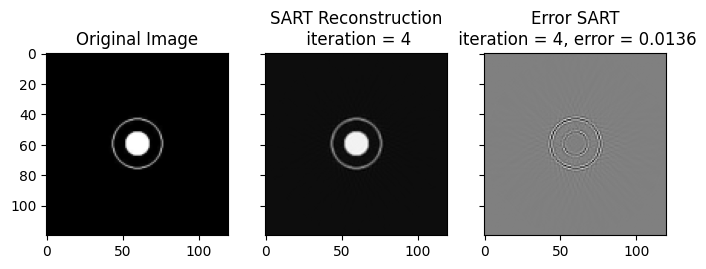

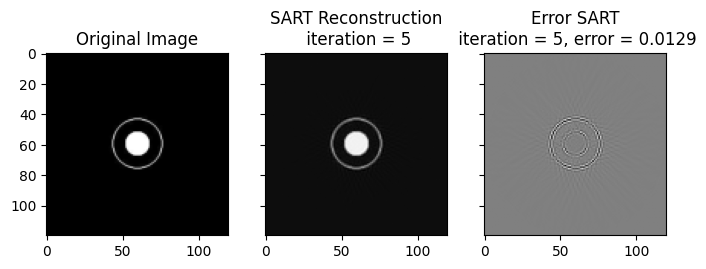

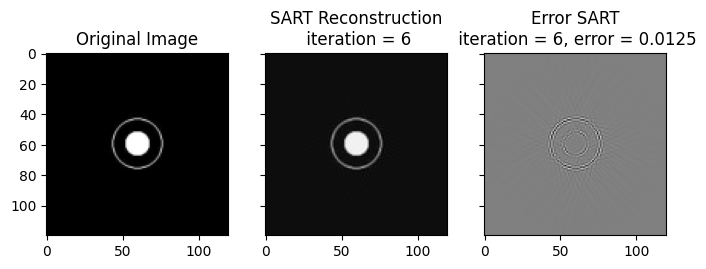

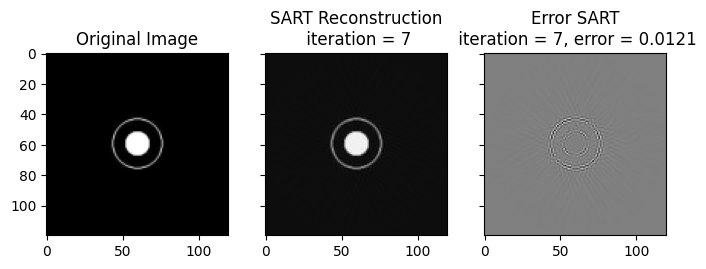

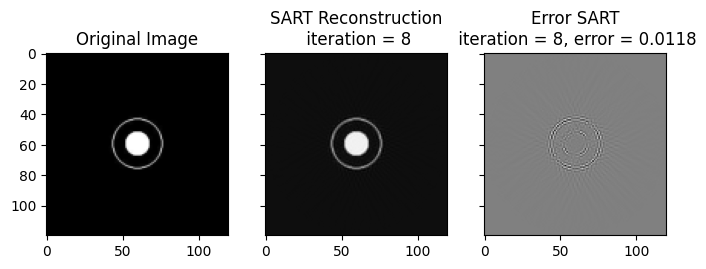

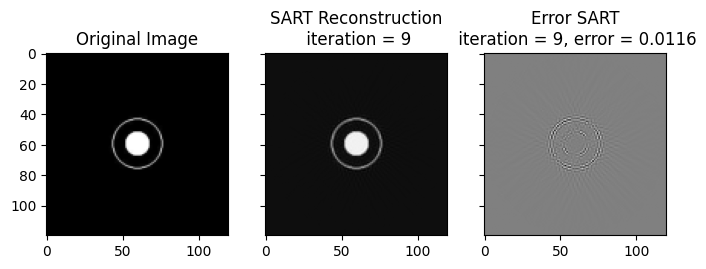

In [ ]:
apply_sart(circle, 180, 10)

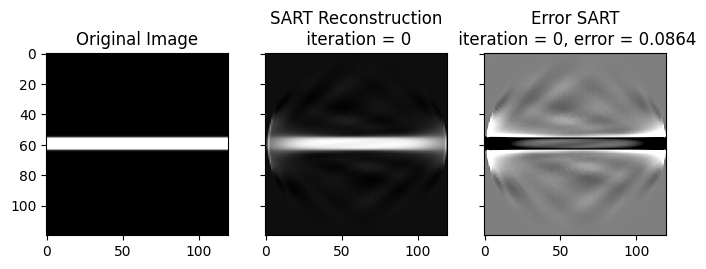

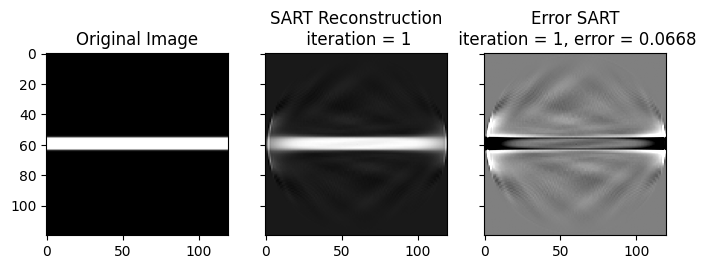

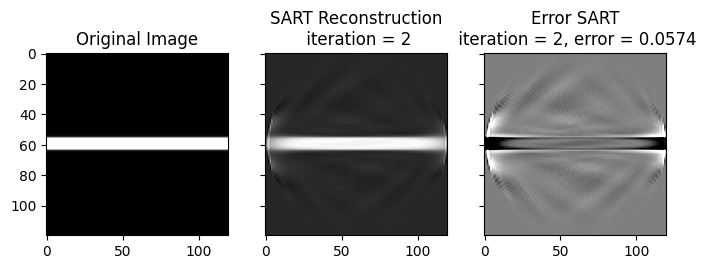

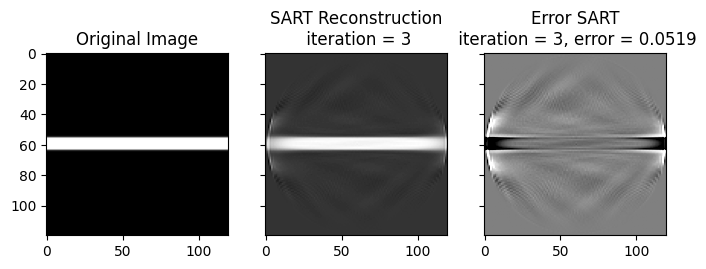

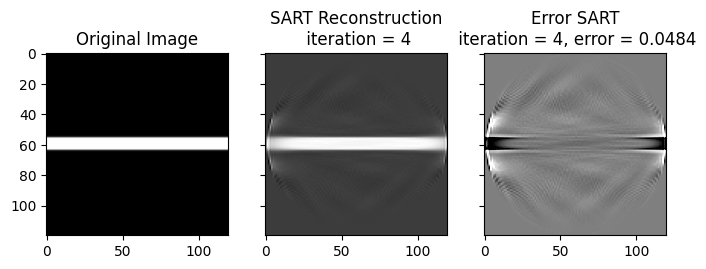

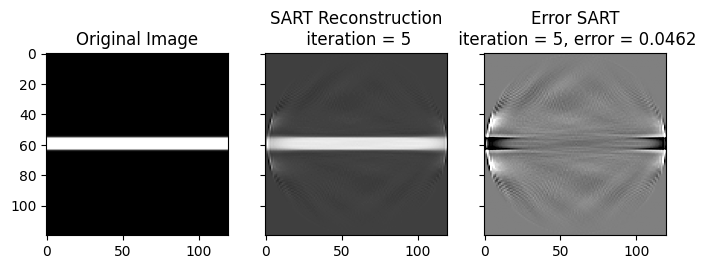

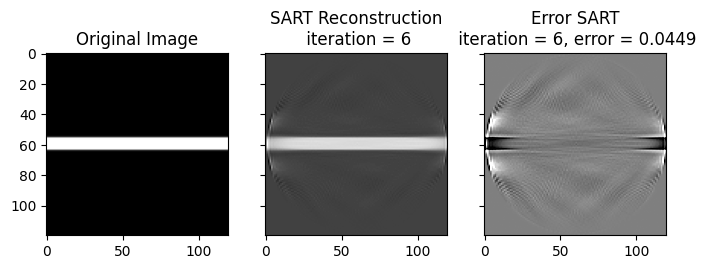

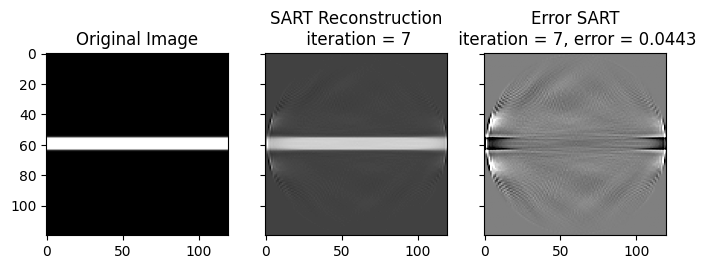

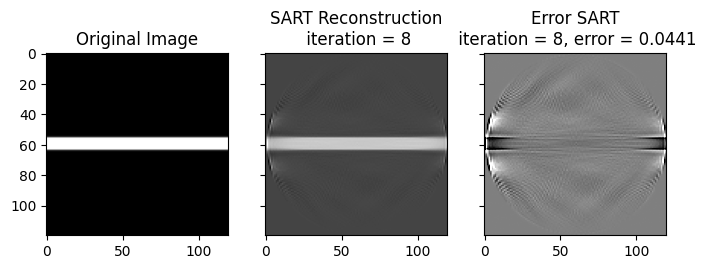

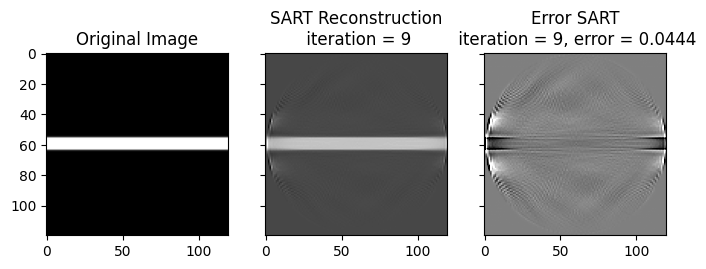

In [ ]:
apply_sart(line, 180, 10)